In [ ]:
# Install the Ollama server
!curl -fsSL https://ollama.com/install.sh | sh

# Install the Ollama Python client library
!pip install ollama

# Start the Ollama server in the background
!nohup ollama serve &

# Wait for a few seconds to allow the server to start
import time
print("Waiting for Ollama server to start...")
time.sleep(5)
print("Ollama server is running.")

# Pull the llama3 model. You only need to do this once.
!ollama pull llama3
print("Llama 3 model is ready.")

>>> Installing ollama to /usr/local
>>> Downloading Linux amd64 bundle
######################################################################## 100.0%
>>> Creating ollama user...
>>> Adding ollama user to video group...
>>> Adding current user to ollama group...
>>> Creating ollama systemd service...
>>> The Ollama API is now available at 127.0.0.1:11434.
>>> Install complete. Run "ollama" from the command line.
nohup: appending output to 'nohup.out'
Waiting for Ollama server to start...
Ollama server is running.

Llama 3 model is ready.


In [ ]:
import json
import re
from typing import List, Dict, Any, Optional
import ollama
import os


# =====================
# Model Setup
# =====================
# The Ollama model you want to use. Ensure the Ollama server is running and 'llama3' is pulled.
OLLAMA_MODEL = 'llama3'

def generate(prompt: str, model_name: str) -> str:
    """
    Uses the Ollama client to generate a response from a specified model.
    The prompt is formatted as a single user message.
    """
    response = ollama.chat(
        model=model_name,
        messages=[
            {'role': 'user', 'content': prompt}
        ],
        stream=False
    )
    return response['message']['content']

# =====================
# Canonical Schema
# =====================
# The target keys for the normalized output.
CANONICAL_KEYS = [
    "active_ingredient", "purpose", "indications_and_usage", "do_not_use",
    "ask_doctor", "ask_doctor_or_pharmacist", "warnings", "stop_use",
    "dosage_and_administration", "pregnancy_or_breast_feeding",
    "keep_out_of_reach_of_children", "inactive_ingredient", "storage_and_handling",
    "overdose_warning"
]

# =====================
# Few-shot examples
# =====================
# These examples are crucial for guiding the model on how to normalize different data structures.
# They are a combination of your original examples and new ones to handle specific cases.
few_shot_examples: List[str] = [
    # === Original Example 1 ===
    """Input:
{
  "ACETAMINOPHEN, PHENYLEPHRINE HYDROCHLORIDE, DEXTROMETHORPHAN HYDROBROMIDE, AND CHLORPHENIRAMINE MALEATE": {
    "active_ingredient": "Active ingredients (in each caplet) Purpose Acetaminophen 325 mg Pain reliever/fever reducer Dextromethorphan HBr 10 mg Cough suppressant Phenylephrine HCl 5 mg Nasal decongestant Active ingredients (in each caplet) Purpose Acetaminophen 325 mg Pain reliever/fever reducer Chlorpheniramine maleate 2 mg Antihistamine Dextromethorphan HBr 10 mg Cough suppressant Phenylephrine HCl 5 mg Nasal decongestant",
    "ask_doctor": "Ask a doctor before use if you have liver disease heart disease high blood pressure thyroid disease diabetes trouble urinating due to an enlarged prostate gland persistent or chronic cough such as occurs with smoking, asthma, or emphysema cough that occurs with too much phlegm (mucus) a breathing problem such as emphysema or chronic bronchitis glaucoma",
    "ask_doctor_or_pharmacist": "Ask a doctor or pharmacist before use if you are taking the blood thinning drug warfarin taking sedatives or tranquilizers",
    "do_not_use": "Do not use with any other drug containing acetaminophen... allergic reaction to this product or any of its ingredients",
    "dosage_and_administration": "Directions do not take more than directed... children under 12 years ask a doctor",
    "inactive_ingredient": "Inactive ingredients Cold Max Day acesulfame potassium... titanium dioxide",
    "indications_and_usage": "Uses temporarily relieves these common cold/flu symptoms...",
    "keep_out_of_reach_of_children": "Keep out of reach of children.",
    "pregnancy_or_breast_feeding": "If pregnant or breast-feeding, ask a health professional before use.",
    "purpose": "Purpose Pain reliever/fever reducer Cough suppressant Nasal decongestant...",
    "stop_use": "Stop use and ask a doctor if nervousness, dizziness, or sleeplessness occur...",
    "storage_and_handling": "Other information store between 20-25°C...",
    "warnings": "Warnings Liver warning This product contains acetaminophen..."
  }
}

Output:
{
  "ACETAMINOPHEN, PHENYLEPHRINE HCL, DEXTROMETHORPHAN HBR, CHLORPHENIRAMINE MALEATE": {
    "active_ingredient": {
      "Day": [
        "Acetaminophen 325 mg (Pain reliever/fever reducer)",
        "Dextromethorphan HBr 10 mg (Cough suppressant)",
        "Phenylephrine HCl 5 mg (Nasal decongestant)"
      ],
      "Night": [
        "Acetaminophen 325 mg (Pain reliever/fever reducer)",
        "Chlorpheniramine maleate 2 mg (Antihistamine)",
        "Dextromethorphan HBr 10 mg (Cough suppressant)",
        "Phenylephrine HCl 5 mg (Nasal decongestant)"
      ]
    },
    "purpose": {
      "Day": ["Pain reliever/fever reducer", "Cough suppressant", "Nasal decongestant"],
      "Night": ["Pain reliever/fever reducer", "Antihistamine", "Cough suppressant", "Nasal decongestant"]
    },
    "indications_and_usage": {
      "Day": [
        "Relieves minor aches and pains, headache, sore throat",
        "Reduces fever",
        "Relieves nasal and sinus congestion/pressure",
        "Promotes nasal/sinus drainage",
        "Helps loosen mucus",
        "Suppresses cough"
      ],
      "Night": [
        "Relieves minor aches and pains, headache, sore throat",
        "Reduces fever",
        "Relieves nasal and sinus congestion/pressure",
        "Relieves runny nose and sneezing",
        "Suppresses cough (to aid sleep)"
      ]
    },
    "do_not_use": [
      "With other acetaminophen-containing drugs",
      "With MAOIs or within 2 weeks of stopping them",
      "If allergic to ingredients"
    ],
    "ask_doctor": [
      "Liver disease",
      "Heart disease",
      "High blood pressure",
      "Thyroid disease",
      "Diabetes",
      "Glaucoma",
      "Breathing problems (emphysema, chronic bronchitis, asthma)",
      "Chronic cough or cough with excessive phlegm",
      "Trouble urinating due to enlarged prostate"
    ],
    "ask_doctor_or_pharmacist": [
      "If taking warfarin",
      "If taking sedatives or tranquilizers"
    ],
    "warnings": [
      "Max 10 caplets (3250 mg acetaminophen) per 24 hrs",
      "Severe liver damage risk if >4000 mg acetaminophen in 24 hrs...",
      "Severe skin reactions possible (redness, blisters, rash)",
      "Sore throat warning...",
      "Night: may cause drowsiness, avoid alcohol, sedatives, driving or operating machinery",
      "Excitability may occur in children"
    ],
    "stop_use": [
      "Nervousness, dizziness, or sleeplessness occur",
      "Pain, nasal congestion, or cough worsens or lasts >7 days",
      "Fever worsens or lasts >3 days",
      "Redness or swelling present",
      "New symptoms occur",
      "Cough returns or occurs with rash or persistent headache"
    ],
    "dosage_and_administration": [
      "Adults/children 12+: 2 caplets every 4 hrs (swallow whole, do not crush/chew)",
      "Do not exceed 10 caplets in 24 hrs",
      "Do not take Day and Night caplets together",
      "Children under 12: ask doctor"
    ],
    "inactive_ingredient": {
      "Day": ["Acesulfame potassium", "Colloidal silicon dioxide", "...", "Titanium dioxide"],
      "Night": ["Acesulfame potassium", "Colloidal silicon dioxide", "...", "Titanium dioxide"]
    },
    "pregnancy_or_breast_feeding": ["Consult healthcare professional before use"],
    "keep_out_of_reach_of_children": ["Keep out of reach of children"],
    "storage_and_handling": [
      "Store between 20-25°C (68-77°F) in a dry place",
      "Retain carton for full product information"
    ],
    "overdose_warning": [
      "In case of overdose, seek medical help or call Poison Control (1-800-222-1222)",
      "Quick medical attention is critical, even if no symptoms appear"
    ]
  }
}
""",

    # === Original Example 2 ===
    """Input:
{
  "430R WALGREENS ACETAMINOPHEN 500 MG,DIPHENHYDRAMINE HCL 25 MG TABLET": {
    "active_ingredient": "Active ingredients (in each caplet) Acetaminophen 500 mg Diphenhydramine HCl 25 mg",
    "ask_doctor": "Ask a doctor before use if you have liver disease...",
    "do_not_use": "Do not use with any other drug containing acetaminophen...",
    "dosage_and_administration": "Directions do not take more than directed...",
    "inactive_ingredient": "Inactive ingredients carnauba wax, colloidal silicon dioxide...",
    "indications_and_usage": "Uses temporary relief of occasional headaches and minor aches and pains with accompanying sleeplessness",
    "keep_out_of_reach_of_children": "Keep out of reach of children. Overdose warning: In case of overdose...",
    "pregnancy_or_breast_feeding": "If pregnant or breast-feeding, ask a health professional before use.",
    "purpose": "Purpose Pain reliever Nighttime sleep aid",
    "stop_use": "Stop use and ask a doctor if sleeplessness persists continuously for more than 2 weeks...",
    "warnings": "Warnings Liver warning: This product contains acetaminophen..."
  }
}

Output:
{
  "430R WALGREENS ACETAMINOPHEN 500 MG, DIPHENHYDRAMINE HCL 25 MG TABLET": {
    "active_ingredient": ["Acetaminophen 500 mg", "Diphenhydramine HCl 25 mg"],
    "purpose": ["Pain reliever", "Nighttime sleep aid"],
    "indications_and_usage": [
      "Temporary relief of headaches",
      "Relief of minor aches and pains with sleeplessness"
    ],
    "do_not_use": [
      "With other acetaminophen-containing drugs",
      "With other diphenhydramine products (oral or topical)",
      "In children under 12 years",
      "If allergic to ingredients"
    ],
    "ask_doctor": [
      "Liver disease",
      "Breathing problems (emphysema, chronic bronchitis)",
      "Trouble urinating due to enlarged prostate",
      "Glaucoma"
    ],
    "ask_doctor_or_pharmacist": [
      "If taking warfarin",
      "If taking sedatives or tranquilizers"
    ],
    "warnings": [
      "Liver damage risk if >4000 mg acetaminophen in 24 hours",
      "Risk increased with ≥3 alcoholic drinks/day",
      "Possible severe skin reactions (redness, blisters, rash)"
    ],
    "stop_use": [
      "Sleeplessness persists >2 weeks (possible underlying illness)",
      "Pain lasts >10 days",
      "Fever lasts >3 days",
      "Redness or swelling present",
      "New symptoms occur"
    ],
    "dosage_and_administration": [
      "Adults and children 12+: 2 caplets at bedtime",
      "Do not exceed 2 caplets in 24 hours",
      "Children under 12: do not use"
    ],
    "pregnancy_or_breast_feeding": ["Consult a health professional before use"],
    "keep_out_of_reach_of_children": [
      "Seek immediate medical help in case of overdose",
      "Contact Poison Control: 1-800-222-1222"
    ],
    "inactive_ingredient": [
      "Carnauba wax",
      "Colloidal silicon dioxide",
      "FD&C Blue #1 aluminum lake",
      "Microcrystalline cellulose",
      "Polyethylene glycol",
      "Polyvinyl alcohol",
      "Povidone",
      "Pregelatinized starch",
      "Sodium starch glycolate",
      "Stearic acid",
      "Talc",
      "Titanium dioxide"
    ],
    "storage_and_handling": ["Information not provided"],
    "overdose_warning": ["In case of overdose, get medical help or contact a Poison Control Center right away (1-800-222-1222). Quick medical attention is critical for adults as well as for children even if you do not notice any signs or symptoms."]
  }
}
""",
    # === NEW EXAMPLE 3 (for VYXEOS Table) ===
    """Input:
{
  "(DAUNORUBICIN AND CYTARABINE) LIPOSOME": {
    "indications_and_usage": "VYXEOS is indicated for the treatment of newly-diagnosed therapy-related acute myeloid leukemia (t-AML) or AML with myelodysplasia-related changes (AML-MRC) in adults and pediatric patients 1 year and older.",
    "dosage_and_administration": {
      "text": "VYXEOS is a hazardous drug. Follow applicable special handling and disposal procedures.\n\nReconstitute and further dilute VYXEOS prior to intravenous infusion. Reconstitution: ... (long text)...",
      "table": "<table styleCode=\"Noautorules\" width=\"100%\"><caption>Table 1: Dose and Schedule for VYXEOS</caption><col width=\"38%\"/><col width=\"38%\"/><tbody><tr><td styleCode=\"Rrule Botrule Lrule Toprule \" valign=\"top\"><paragraph><content styleCode=\"bold\">Cycle</content></paragraph></td><td styleCode=\"Rrule Botrule Lrule Toprule \" valign=\"top\"><paragraph><content styleCode=\"bold\">VYXEOS Dose and Schedule</content></paragraph></td></tr><tr><td styleCode=\"Rrule Lrule Botrule \" valign=\"top\"><paragraph><content styleCode=\"bold\">First Induction</content></paragraph></td><td styleCode=\"Rrule Lrule Toprule Botrule \" valign=\"top\"><paragraph>(daunorubicin 44 mg/m² and cytarabine 100 mg/m²) liposome days 1, 3, and 5</paragraph></td></tr><tr><td styleCode=\"Rrule Lrule Toprule Botrule \" valign=\"top\"><paragraph><content styleCode=\"bold\">Second Induction <sup>a</sup></content></paragraph></td><td styleCode=\"Rrule Lrule Toprule Botrule \" valign=\"top\"><paragraph>(daunorubicin 44 mg/m² and cytarabine 100 mg/m²) liposome days 1 and 3</paragraph></td></tr><tr><td styleCode=\"Rrule Botrule Lrule Toprule \" valign=\"top\"><paragraph><content styleCode=\"bold\">Consolidation</content></paragraph></td><td styleCode=\"Rrule Botrule Lrule Toprule \" valign=\"top\"><paragraph>(daunorubicin 29 mg/m² and cytarabine 65 mg/m²) liposome days 1 and 3</paragraph></td></tr></tbody></table>"
    }
  }
}

Output:
{
  "(DAUNORUBICIN AND CYTARABINE) LIPOSOME": {
    "active_ingredient": [],
    "purpose": [],
    "indications_and_usage": [
      "Treatment of newly-diagnosed therapy-related acute myeloid leukemia (t-AML) or AML with myelodysplasia-related changes (AML-MRC) in adults and pediatric patients 1 year and older."
    ],
    "do_not_use": [],
    "ask_doctor": [],
    "ask_doctor_or_pharmacist": [],
    "warnings": [],
    "stop_use": [],
    "dosage_and_administration": {
      "first_induction": "Daunorubicin 44 mg/m² and Cytarabine 100 mg/m² on days 1, 3, and 5",
      "second_induction": "Daunorubicin 44 mg/m² and Cytarabine 100 mg/m² on days 1 and 3",
      "consolidation": "Daunorubicin 29 mg/m² and Cytarabine 65 mg/m² on days 1 and 3"
    },
    "pregnancy_or_breast_feeding": [],
    "keep_out_of_reach_of_children": [],
    "inactive_ingredient": [],
    "storage_and_handling": [],
    "overdose_warning": []
  }
}
""",
    # === NEW EXAMPLE 4 (for SALINE bulleted list) ===
    """Input:
{
  "(SALINE)": {
    "active_ingredient": "",
    "purpose": "Restores Moisture",
    "indications_and_usage": [
      "Moisturizes dry, irritated, or crusty nasal passages due to low humidity, heated environments, air travel, allergies or colds",
      "Helps loosens mucus secretions to aid aspiration and removal from nose and sinuses allowing for easier breathing"
    ],
    "do_not_use": [],
    "ask_doctor": [],
    "ask_doctor_or_pharmacist": [],
    "warnings": [
      "The use of this dispenser by more than one person may spread infection",
      "Wipe nozzle clean after each use"
    ],
    "stop_use": [],
    "dosage_and_administration": "Directions (For nasal use only) ▪ Newborns/ Infants - 2 to 6 drops in each nostril as often as needed or as directed by your doctor. ▪ Children & Adults -2 to 6 Sprays /drops into each nostril as often as needed or as directed by a doctor.",
    "keep_out_of_reach_of_children": "Keep Out of Reach of Children Keep out of reach of children",
    "pregnancy_or_breast_feeding": [],
    "storage_and_handling": "",
    "overdose_warning": []
  }
}

Output:
{
  "(SALINE)": {
    "active_ingredient": [],
    "purpose": ["Restores Moisture"],
    "indications_and_usage": [
      "Moisturizes dry, irritated, or crusty nasal passages due to low humidity, heated environments, air travel, allergies or colds",
      "Helps loosens mucus secretions to aid aspiration and removal from nose and sinuses allowing for easier breathing"
    ],
    "do_not_use": [],
    "ask_doctor": [],
    "ask_doctor_or_pharmacist": [],
    "warnings": [
      "The use of this dispenser by more than one person may spread infection",
      "Wipe nozzle clean after each use"
    ],
    "stop_use": [],
    "dosage_and_administration": [
      "For nasal use only",
      "Newborns/Infants: 2 to 6 drops in each nostril as often as needed or as directed by your doctor.",
      "Children & Adults: 2 to 6 Sprays/drops into each nostril as often as needed or as directed by a doctor."
    ],
    "keep_out_of_reach_of_children": [
      "Keep Out of Reach of Children"
    ],
    "pregnancy_or_breast_feeding": [],
    "inactive_ingredient": [],
    "storage_and_handling": [],
    "overdose_warning": []
  }
}
"""
]

# =====================
# Prompt Template
# =====================
PROMPT_TEMPLATE = """You are a JSON normalizer for drug label entries.
INPUT: A JSON object `{raw_entry}` containing messy fields from drug labels.
TASK: Produce a **clean JSON object** with exactly the keys below (use empty lists or strings if missing):
{schema}

Rules:
- Remove duplicated content, collapse synonyms, split multi-points into lists.
- Split Day/Night items into sub-objects where relevant.
- Remove headings (like 'DOSAGE AND ADMINISTRATION') and bracketed notes.
- Normalize lists: trim whitespace, remove trailing punctuation, deduplicate preserving order.
- Output JSON only (no commentary). Ensure valid JSON.

Examples:
{few_shot}

Now process this input:
INPUT_JSON: {raw_entry}

OUTPUT (valid JSON only, no extra text):
IMPORTANT: Output must be a single valid JSON object. Do not include commentary.
"""

def build_prompt(drug_name: str, raw_entry: Dict[str, Any], few_shot_examples: List[str]) -> str:
    schema = json.dumps({drug_name: {k: "" for k in CANONICAL_KEYS}}, indent=2)
    few_shot = "\n\n".join(few_shot_examples)
    return PROMPT_TEMPLATE.format(
        raw_entry=json.dumps({drug_name: raw_entry}, ensure_ascii=False, indent=2),
        schema=schema,
        few_shot=few_shot
    )

# =====================
# Postprocessing
# =====================
def extract_json(text: str) -> Optional[Dict[str, Any]]:
    try:
        text = text.strip()
        if text.startswith('```json') and text.endswith('```'):
            text = text[len('```json'):-len('```')].strip()
        match = re.search(r"\{.*\}", text, re.DOTALL)
        if match:
            return json.loads(match.group(0))
    except json.JSONDecodeError as e:
        print("JSON decode error:", e)
    return None

def normalize_lists(obj: Any) -> Any:
    if isinstance(obj, dict):
        return {k: normalize_lists(v) for k, v in obj.items()}
    if isinstance(obj, list):
        seen = set()
        out = []
        for item in obj:
            if isinstance(item, str):
                s = item.strip()
                if s.endswith('.'):
                    s = s[:-1].strip()
                if s not in seen:
                    seen.add(s)
                    out.append(s)
            else:
                s = normalize_lists(item)
                key = json.dumps(s, sort_keys=True)
                if key not in seen:
                    seen.add(key)
                    out.append(s)
        return out
    if isinstance(obj, str):
        return obj.strip()
    return obj

# =====================
# File Processing
# =====================
def process_file_in_chunks(input_path: str, output_path: str, chunk_size: int = 500, start_index: int = 0):
    """
    Reads a JSON file, processes it in chunks, and saves each chunk to a separate file.
    This allows you to resume processing if the connection is lost.
    """
    try:
        with open(input_path, 'r', encoding='utf-8') as f:
            data = json.load(f)
    except FileNotFoundError:
        print(f"Error: The file '{input_path}' was not found.")
        return
    except json.JSONDecodeError:
        print(f"Error: The file '{input_path}' is not a valid JSON file.")
        return

    items = list(data.items())
    total_items = len(items)

    print(f"Total entries to process: {total_items}")

    for i in range(start_index, total_items, chunk_size):
        chunk_start = i
        chunk_end = min(i + chunk_size, total_items)  # Ensure chunk_end does not exceed total_items
        chunk = items[chunk_start:chunk_end]

        results = {}
        print("-" * 50)
        print(f"Processing chunk from index {chunk_start} to {chunk_end-1}...")

        for j, (key, raw_entry) in enumerate(chunk):
            print(f"  - Processing {chunk_start + j + 1}/{total_items}: {key}")

            prompt = build_prompt(key, raw_entry, few_shot_examples)

            try:
                raw_out = generate(prompt, OLLAMA_MODEL)
                parsed = extract_json(raw_out)

                if parsed:
                    parsed = normalize_lists(parsed)
                    results[key] = parsed
                    print(f"  - Successfully normalized {key}.")
                else:
                    print(f"  - Warning: Failed to parse valid JSON for {key}.")
                    results[key] = {"error": "Failed to parse JSON from LLM output."}
            except Exception as e:
                print(f"  - Failed to process {key}: {e}")
                results[key] = {"error": str(e)}

        # Save the current chunk to a file
        chunk_output_path = f"/content/drive/MyDrive/drug_data/drug_data/normalized_drug_data_chunk_{chunk_start}-{chunk_end-1}.json"
        with open(chunk_output_path, 'w', encoding='utf-8') as wf:
            json.dump(results, wf, indent=2, ensure_ascii=False)

        print(f"Chunk processing complete. Normalized output written to '{chunk_output_path}'.")
        print("-" * 50)

        # Stop after the first chunk for this specific request
        if chunk_size == 10569 and i == 0:
            break

    print("All requested chunks have been processed.")

# =====================
# Run the process
# =====================
if __name__ == "__main__":
    # Your specified file paths and sample count
    input_path = "/content/drive/MyDrive/updateddrugdata.json"

    # Process only the first 10 items
    process_file_in_chunks(input_path, output_path="dummy.json", chunk_size=50, start_index=6599)

Total entries to process: 10839
--------------------------------------------------
Processing chunk from index 6599 to 6648...
  - Processing 6600/10839: ICE CHILL ICED MINT AND LEMON 48H ANTIPERSPIRANT
  - Successfully normalized ICE CHILL ICED MINT AND LEMON 48H ANTIPERSPIRANT.
  - Processing 6601/10839: ICE CHILL ICED MINT AND LEMON 48H SWEAT AND ODOR PROTECTION ANTIPERSPIRANT
  - Successfully normalized ICE CHILL ICED MINT AND LEMON 48H SWEAT AND ODOR PROTECTION ANTIPERSPIRANT.
  - Processing 6602/10839: ICHTHAMMOL
  - Successfully normalized ICHTHAMMOL.
  - Processing 6603/10839: ICHTHAMMOL 20%
  - Successfully normalized ICHTHAMMOL 20%.
  - Processing 6604/10839: ICHTHAMMOL OINTMENT
  - Successfully normalized ICHTHAMMOL OINTMENT.
  - Processing 6605/10839: ICHTHAMMOL, CALCIUM SULFIDE, CALENDULA OFFICINALIS FLOWERING TOP, ARNICA MONTANA, ECHINACEA ANGUSTIFOLIA, SILICON DIOXIDE, SULFUR
  - Successfully normalized ICHTHAMMOL, CALCIUM SULFIDE, CALENDULA OFFICINALIS FLOWERING TOP, AR

# single json object graph

In [ ]:
import json
import networkx as nx

def build_complete_knowledge_graph(json_data):
    """
    Builds a NetworkX knowledge graph with a complete set of relationships for each drug.

    Args:
        json_data (dict): A dictionary containing the drug data.

    Returns:
        nx.DiGraph: The constructed knowledge graph.
    """
    G = nx.DiGraph()

    # Define all 14 relationship types
    all_relations = [
        "active_ingredient",
        "purpose",
        "indications_and_usage",
        "do_not_use",
        "ask_doctor",
        "ask_doctor_or_pharmacist",
        "warnings",
        "stop_use",
        "dosage_and_administration",
        "keep_out_of_reach_of_children",
        "pregnancy_or_breast_feeding",
        "storage_and_handling",
        "inactive_ingredient",
        "drug_interactions",
        "overdose_warning"
    ]

    # Create a generic "No Data" node to link missing information
    G.add_node("NO_DATA_AVAILABLE", type="status")

    for drug_name, drug_info in json_data.items():
        # Get the inner dictionary for drug information
        drug_data = drug_info.get(drug_name) if isinstance(drug_info, dict) and drug_name in drug_info else drug_info
        if not drug_data or not isinstance(drug_data, dict):
            continue

        # Create the main Drug Product node
        G.add_node(drug_name, type="drug")

        # Systematically add all relationships
        for relation_type in all_relations:
            items = drug_data.get(relation_type, [])

            if not items:
                # If data is missing, link to the "NO_DATA_AVAILABLE" node
                G.add_edge(drug_name, "NO_DATA_AVAILABLE", relationship=relation_type.upper())
            else:
                if isinstance(items, dict):
                    # Handle Day/Night structure
                    for day_or_night, sub_items in items.items():
                        for item in sub_items:
                            item_name = str(item).strip()
                            if item_name:
                                node_label = f"{item_name} ({day_or_night})"
                                G.add_node(node_label, type=relation_type)
                                G.add_edge(drug_name, node_label, relationship=relation_type.upper())
                else:
                    for item in items:
                        item_name = str(item).strip()
                        if item_name:
                            G.add_node(item_name, type=relation_type)
                            G.add_edge(drug_name, item_name, relationship=relation_type.upper())

    return G

# The JSON data provided by the user
input_data = {
    "ACETAMINOPHEN, PHENYLEPHRINE HYDROCHLORIDE, DEXTROMETHORPHAN HYDROBROMIDE, AND CHLORPHENIRAMINE MALEATE": {
        "active_ingredient": {
            "Day": [
                "Acetaminophen 325 mg (Pain reliever/fever reducer)",
                "Dextromethorphan HBr 10 mg (Cough suppressant)",
                "Phenylephrine HCl 5 mg (Nasal decongestant)"
            ],
            "Night": [
                "Acetaminophen 325 mg (Pain reliever/fever reducer)",
                "Chlorpheniramine maleate 2 mg (Antihistamine)",
                "Dextromethorphan HBr 10 mg (Cough suppressant)",
                "Phenylephrine HCl 5 mg (Nasal decongestant)"
            ]
        },
        "purpose": {
            "Day": ["Pain reliever/fever reducer", "Cough suppressant", "Nasal decongestant"],
            "Night": ["Pain reliever/fever reducer", "Antihistamine", "Cough suppressant", "Nasal decongestant"]
        },
        "indications_and_usage": {
            "Day": [
                "Relieves minor aches and pains, headache, sore throat",
                "Reduces fever",
                "Relieves nasal and sinus congestion/pressure",
                "Promotes nasal/sinus drainage",
                "Helps loosen mucus",
                "Suppresses cough"
            ],
            "Night": [
                "Relieves minor aches and pains, headache, sore throat",
                "Reduces fever",
                "Relieves nasal and sinus congestion/pressure",
                "Relieves runny nose and sneezing",
                "Suppresses cough (to aid sleep)"
            ]
        },
        "do_not_use": [
            "With other acetaminophen-containing drugs",
            "With MAOIs or within 2 weeks of stopping them",
            "If allergic to ingredients"
        ],
        "ask_doctor": [
            "Liver disease",
            "Heart disease",
            "High blood pressure",
            "Thyroid disease",
            "Diabetes",
            "Glaucoma",
            "Breathing problems (emphysema, chronic bronchitis, asthma)",
            "Chronic cough or cough with excessive phlegm",
            "Trouble urinating due to enlarged prostate"
        ],
        "ask_doctor_or_pharmacist": [
            "If taking warfarin",
            "If taking sedatives or tranquilizers"
        ],
        "warnings": [
            "Max 10 caplets (3250 mg acetaminophen) per 24 hrs",
            "Severe liver damage risk if >4000 mg acetaminophen in 24 hrs...",
            "Severe skin reactions possible (redness, blisters, rash)",
            "Sore throat warning...",
            "Night: may cause drowsiness, avoid alcohol, sedatives, driving or operating machinery",
            "Excitability may occur in children"
        ],
        "stop_use": [
            "Nervousness, dizziness, or sleeplessness occur",
            "Pain, nasal congestion, or cough worsens or lasts >7 days",
            "Fever worsens or lasts >3 days",
            "Redness or swelling present",
            "New symptoms occur",
            "Cough returns or occurs with rash or persistent headache"
        ],
        "dosage_and_administration": [
            "Adults/children 12+: 2 caplets every 4 hrs (swallow whole, do not crush/chew)",
            "Do not exceed 10 caplets in 24 hrs",
            "Do not take Day and Night caplets together",
            "Children under 12: ask doctor"
        ],
        "inactive_ingredient": {
            "Day": ["Acesulfame potassium", "Colloidal silicon dioxide", "...", "Titanium dioxide"],
            "Night": ["Acesulfame potassium", "Colloidal silicon dioxide", "...", "Titanium dioxide"]
        },
        "pregnancy_or_breast_feeding": ["Consult healthcare professional before use"],
        "keep_out_of_reach_of_children": ["Keep out of reach of children"],
        "storage_and_handling": [
            "Store between 20-25°C (68-77°F) in a dry place",
            "Retain carton for full product information"
        ],
        "overdose_warning": [
            "In case of overdose, seek medical help or call Poison Control (1-800-222-1222)",
            "Quick medical attention is critical, even if no symptoms appear"
        ]
    }
}

# Build the knowledge graph
kg = build_complete_knowledge_graph(input_data)
print(f"Number of nodes: {kg.number_of_nodes()}")
print(f"Number of edges: {kg.number_of_edges()}")

# Example of a query to demonstrate the graph
drug_name = "ACETAMINOPHEN, PHENYLEPHRINE HYDROCHLORIDE, DEXTROMETHORPHAN HYDROBROMIDE, AND CHLORPHENIRAMINE MALEATE"
print(f"Nodes connected to '{drug_name}' with the 'HAS_PURPOSE' relationship:")
for neighbor in kg.successors(drug_name):
    if 'relationship' in kg.edges[drug_name, neighbor] and kg.edges[drug_name, neighbor]['relationship'] == 'PURPOSE':
        print(f" - {neighbor}")

Number of nodes: 71
Number of edges: 70
Nodes connected to 'ACETAMINOPHEN, PHENYLEPHRINE HYDROCHLORIDE, DEXTROMETHORPHAN HYDROBROMIDE, AND CHLORPHENIRAMINE MALEATE' with the 'HAS_PURPOSE' relationship:
 - Pain reliever/fever reducer (Day)
 - Cough suppressant (Day)
 - Nasal decongestant (Day)
 - Pain reliever/fever reducer (Night)
 - Antihistamine (Night)
 - Cough suppressant (Night)
 - Nasal decongestant (Night)


/tmp/ipython-input-2659587724.py:182: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = plt.cm.get_cmap('Paired', len(unique_types))


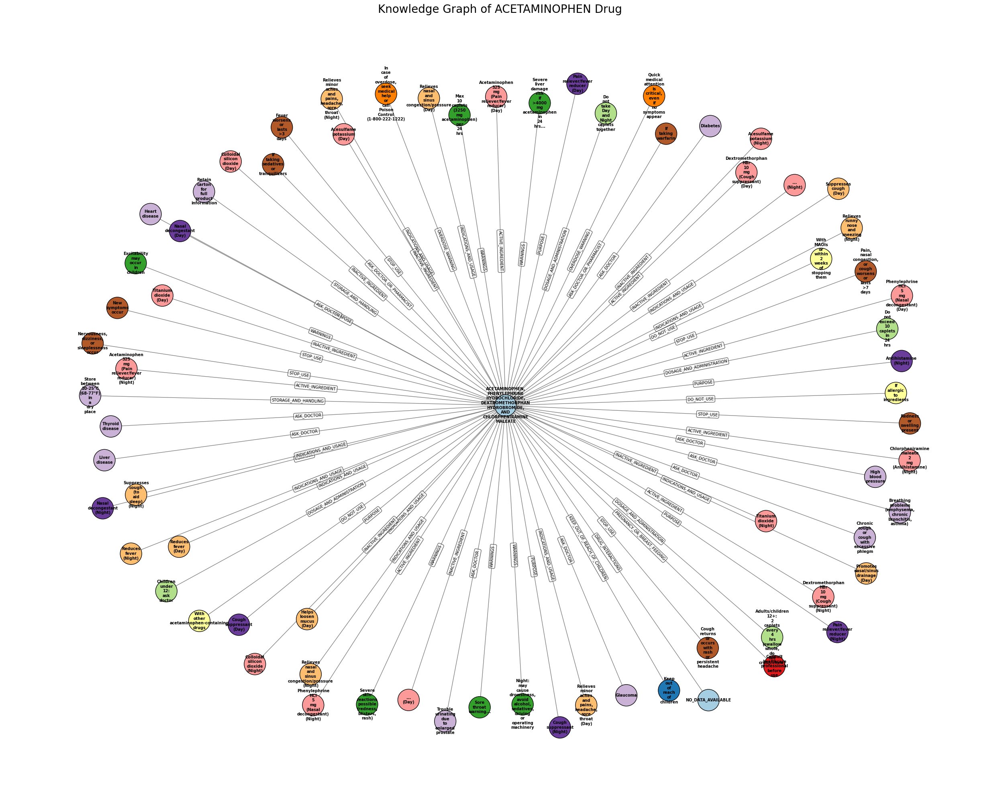

In [ ]:
import json
import networkx as nx
import matplotlib.pyplot as plt

def build_complete_knowledge_graph(json_data):
    """
    Builds a NetworkX knowledge graph with a complete set of relationships for each drug.

    Args:
        json_data (dict): A dictionary containing the drug data.

    Returns:
        nx.DiGraph: The constructed knowledge graph.
    """
    G = nx.DiGraph()

    # Define all 14 relationship types
    all_relations = [
        "active_ingredient",
        "purpose",
        "indications_and_usage",
        "do_not_use",
        "ask_doctor",
        "ask_doctor_or_pharmacist",
        "warnings",
        "stop_use",
        "dosage_and_administration",
        "keep_out_of_reach_of_children",
        "pregnancy_or_breast_feeding",
        "storage_and_handling",
        "inactive_ingredient",
        "drug_interactions",
        "overdose_warning"
    ]

    # Create a generic "No Data" node to link missing information
    G.add_node("NO_DATA_AVAILABLE", type="status")

    for drug_name, drug_info in json_data.items():
        # Get the inner dictionary for drug information
        drug_data = drug_info.get(drug_name) if isinstance(drug_info, dict) and drug_name in drug_info else drug_info
        if not drug_data or not isinstance(drug_data, dict):
            continue

        # Create the main Drug Product node
        G.add_node(drug_name, type="drug")

        # Systematically add all relationships
        for relation_type in all_relations:
            items = drug_data.get(relation_type, [])

            if not items:
                # If data is missing, link to the "NO_DATA_AVAILABLE" node
                G.add_edge(drug_name, "NO_DATA_AVAILABLE", relationship=relation_type.upper())
            else:
                if isinstance(items, dict):
                    # Handle Day/Night structure
                    for day_or_night, sub_items in items.items():
                        for item in sub_items:
                            item_name = str(item).strip()
                            if item_name:
                                node_label = f"{item_name} ({day_or_night})"
                                G.add_node(node_label, type=relation_type)
                                G.add_edge(drug_name, node_label, relationship=relation_type.upper())
                else:
                    for item in items:
                        item_name = str(item).strip()
                        if item_name:
                            G.add_node(item_name, type=relation_type)
                            G.add_edge(drug_name, item_name, relationship=relation_type.upper())

    return G

# The JSON data provided by the user
input_data = {
    "ACETAMINOPHEN, PHENYLEPHRINE HYDROCHLORIDE, DEXTROMETHORPHAN HYDROBROMIDE, AND CHLORPHENIRAMINE MALEATE": {
        "active_ingredient": {
            "Day": [
                "Acetaminophen 325 mg (Pain reliever/fever reducer)",
                "Dextromethorphan HBr 10 mg (Cough suppressant)",
                "Phenylephrine HCl 5 mg (Nasal decongestant)"
            ],
            "Night": [
                "Acetaminophen 325 mg (Pain reliever/fever reducer)",
                "Chlorpheniramine maleate 2 mg (Antihistamine)",
                "Dextromethorphan HBr 10 mg (Cough suppressant)",
                "Phenylephrine HCl 5 mg (Nasal decongestant)"
            ]
        },
        "purpose": {
            "Day": ["Pain reliever/fever reducer", "Cough suppressant", "Nasal decongestant"],
            "Night": ["Pain reliever/fever reducer", "Antihistamine", "Cough suppressant", "Nasal decongestant"]
        },
        "indications_and_usage": {
            "Day": [
                "Relieves minor aches and pains, headache, sore throat",
                "Reduces fever",
                "Relieves nasal and sinus congestion/pressure",
                "Promotes nasal/sinus drainage",
                "Helps loosen mucus",
                "Suppresses cough"
            ],
            "Night": [
                "Relieves minor aches and pains, headache, sore throat",
                "Reduces fever",
                "Relieves nasal and sinus congestion/pressure",
                "Relieves runny nose and sneezing",
                "Suppresses cough (to aid sleep)"
            ]
        },
        "do_not_use": [
            "With other acetaminophen-containing drugs",
            "With MAOIs or within 2 weeks of stopping them",
            "If allergic to ingredients"
        ],
        "ask_doctor": [
            "Liver disease",
            "Heart disease",
            "High blood pressure",
            "Thyroid disease",
            "Diabetes",
            "Glaucoma",
            "Breathing problems (emphysema, chronic bronchitis, asthma)",
            "Chronic cough or cough with excessive phlegm",
            "Trouble urinating due to enlarged prostate"
        ],
        "ask_doctor_or_pharmacist": [
            "If taking warfarin",
            "If taking sedatives or tranquilizers"
        ],
        "warnings": [
            "Max 10 caplets (3250 mg acetaminophen) per 24 hrs",
            "Severe liver damage risk if >4000 mg acetaminophen in 24 hrs...",
            "Severe skin reactions possible (redness, blisters, rash)",
            "Sore throat warning...",
            "Night: may cause drowsiness, avoid alcohol, sedatives, driving or operating machinery",
            "Excitability may occur in children"
        ],
        "stop_use": [
            "Nervousness, dizziness, or sleeplessness occur",
            "Pain, nasal congestion, or cough worsens or lasts >7 days",
            "Fever worsens or lasts >3 days",
            "Redness or swelling present",
            "New symptoms occur",
            "Cough returns or occurs with rash or persistent headache"
        ],
        "dosage_and_administration": [
            "Adults/children 12+: 2 caplets every 4 hrs (swallow whole, do not crush/chew)",
            "Do not exceed 10 caplets in 24 hrs",
            "Do not take Day and Night caplets together",
            "Children under 12: ask doctor"
        ],
        "inactive_ingredient": {
            "Day": ["Acesulfame potassium", "Colloidal silicon dioxide", "...", "Titanium dioxide"],
            "Night": ["Acesulfame potassium", "Colloidal silicon dioxide", "...", "Titanium dioxide"]
        },
        "pregnancy_or_breast_feeding": ["Consult healthcare professional before use"],
        "keep_out_of_reach_of_children": ["Keep out of reach of children"],
        "storage_and_handling": [
            "Store between 20-25°C (68-77°F) in a dry place",
            "Retain carton for full product information"
        ],
        "overdose_warning": [
            "In case of overdose, seek medical help or call Poison Control (1-800-222-1222)",
            "Quick medical attention is critical, even if no symptoms appear"
        ]
    }
}

# Build the knowledge graph
kg = build_complete_knowledge_graph(input_data)

# Set up the visualization
plt.figure(figsize=(25, 20))  # Adjust the figure size for better readability

# Use a spring layout for better node placement
pos = nx.spring_layout(kg, k=0.1, iterations=50)

# Draw the nodes, coloring them by type
node_types = nx.get_node_attributes(kg, 'type')
unique_types = list(set(node_types.values()))
color_map = plt.cm.get_cmap('Paired', len(unique_types))
colors = [color_map(unique_types.index(node_types[node])) for node in kg.nodes()]
nx.draw_networkx_nodes(kg, pos, node_size=1500, node_color=colors, edgecolors='black')

# Draw the edges
nx.draw_networkx_edges(kg, pos, arrowsize=20, edge_color='gray')

# Draw the node labels, wrapping long labels
node_labels = {node: '\n'.join(node.split()) for node in kg.nodes()}
nx.draw_networkx_labels(kg, pos, labels=node_labels, font_size=7, font_family='sans-serif', font_weight='bold')

# Draw the edge labels (the relationship names)
edge_labels = nx.get_edge_attributes(kg, 'relationship')
nx.draw_networkx_edge_labels(kg, pos, edge_labels=edge_labels, font_size=7, bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.6))

plt.title("Knowledge Graph of ACETAMINOPHEN Drug", size=20)
plt.axis('off')  # Turn off the axis
plt.tight_layout()
plt.savefig('knowledge_graph.png')

# multiple json files combined

In [ ]:
import json
import networkx as nx

def build_knowledge_graph_no_empty_edges(json_data):
    """
    Builds a NetworkX knowledge graph without creating edges for missing data.
    Nodes with the same information will be de-duplicated.

    Args:
        json_data (dict): A dictionary containing the drug data.

    Returns:
        nx.DiGraph: The constructed knowledge graph.
    """
    G = nx.DiGraph()

    # The relationships from the JSON keys
    all_relations = [
        "active_ingredient",
        "purpose",
        "indications_and_usage",
        "do_not_use",
        "ask_doctor",
        "ask_doctor_or_pharmacist",
        "warnings",
        "stop_use",
        "dosage_and_administration",
        "keep_out_of_reach_of_children",
        "pregnancy_or_breast_feeding",
        "storage_and_handling",
        "inactive_ingredient",
        "drug_interactions",
        "overdose_warning"
    ]

    for drug_name, drug_info in json_data.items():
        # Handle the nested dictionary structure if it exists
        drug_data = drug_info.get(drug_name) if isinstance(drug_info, dict) and drug_name in drug_info else drug_info
        if not drug_data or not isinstance(drug_data, dict):
            continue

        # Add the main Drug Product node
        G.add_node(drug_name, type="drug")

        # Process each relationship and its data
        for relation_type in all_relations:
            items = drug_data.get(relation_type, [])

            # Check if the data exists and is not empty
            if items:
                # Handle cases where the value is a single item (e.g., a boolean or string) instead of a list
                if not isinstance(items, (list, dict)):
                    items = [items]

                if isinstance(items, dict):
                    for day_or_night, sub_items in items.items():
                        for item in sub_items:
                            item_name = str(item).strip()
                            if item_name:
                                # Create a unique node for each item and add a relationship
                                G.add_node(item_name, type=relation_type)
                                G.add_edge(drug_name, item_name, relationship=f"{relation_type.upper()} ({day_or_night})")
                else:
                    for item in items:
                        item_name = str(item).strip()
                        if item_name:
                            # Create a unique node for each item and add a relationship
                            G.add_node(item_name, type=relation_type)
                            G.add_edge(drug_name, item_name, relationship=relation_type.upper())

    return G

# --- Main Script ---

# File paths from your uploads
file_paths = [
    "normalized_drug_data_chunk_69-168.json",
    "normalized_drug_data_chunk_169-268.json",
    "normalized_drug_data_chunk_269-368.json",
    "normalized_drug_data_chunk_369-468.json",
    "normalized_drug_data_chunk_469-568.json"
]

all_data = {}
for file_path in file_paths:
    with open(file_path, "r") as f:
        data = json.load(f)
        all_data.update(data)

# Build the knowledge graph
kg = build_knowledge_graph_no_empty_edges(all_data)

# Print a summary to demonstrate success
print("Knowledge graph successfully created.")
print(f"Total number of nodes: {kg.number_of_nodes()}")
print(f"Total number of edges: {kg.number_of_edges()}")

Knowledge graph successfully created.
Total number of nodes: 4346
Total number of edges: 9177


In [ ]:
# --- Additional Code to Verify De-duplication ---

# Verify de-duplication by querying for a common symptom like "headache"
common_node_name = "headache"
if common_node_name in kg.nodes():
    # Find all incoming edges to the 'headache' node
    incoming_edges = kg.in_edges(common_node_name, data=True)

    # Filter for edges that specifically have the 'INDICATIONS_AND_USAGE' relationship
    headache_drugs = [
        source for source, target, data in incoming_edges
        if data.get('relationship') == 'INDICATIONS_AND_USAGE'
    ]

    # Print the number of unique drugs connected to the "headache" node
    unique_drugs = set(headache_drugs)
    print(f"The number of unique drugs that treat '{common_node_name}': {len(unique_drugs)}")
    print("\nHere are a few examples of drugs connected to this single node:")
    for drug in list(unique_drugs)[:5]: # Print the first 5 for brevity
        print(f"- {drug}")
else:
    print(f"The node for '{common_node_name}' does not exist in the graph.")

The number of unique drugs that treat 'headache': 8

Here are a few examples of drugs connected to this single node:
- ACETAMINOPHEN, DEXTROMETHORPHAN HYDROBROMIDE, GUAIFENESIN, PHENYLEPHRINE HCL
- ACETAMINOPHEN, DEXTROMETHORPHAN HBR, GUAIFENESIN, PHENYLEPHRINE HCL AND DOXYLAMINE SUCCINATE
- ACETAMINOPHEN, GUAIFENESIN
- ACETAMINOPHEN, DEXTROMETHORPHAN HYDROBROMIDE, DOXYLAMINE SUCCINATE, PHENYLEPHRINE HYDROCHLORIDE
- ACETAMINOPHEN, DEXTROMETHORPHAN HBR, DOXYLAMINE SUCCINATE, PHENYLEPHRINE HCL


/tmp/ipython-input-2819455550.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = plt.cm.get_cmap('Paired', len(unique_types))


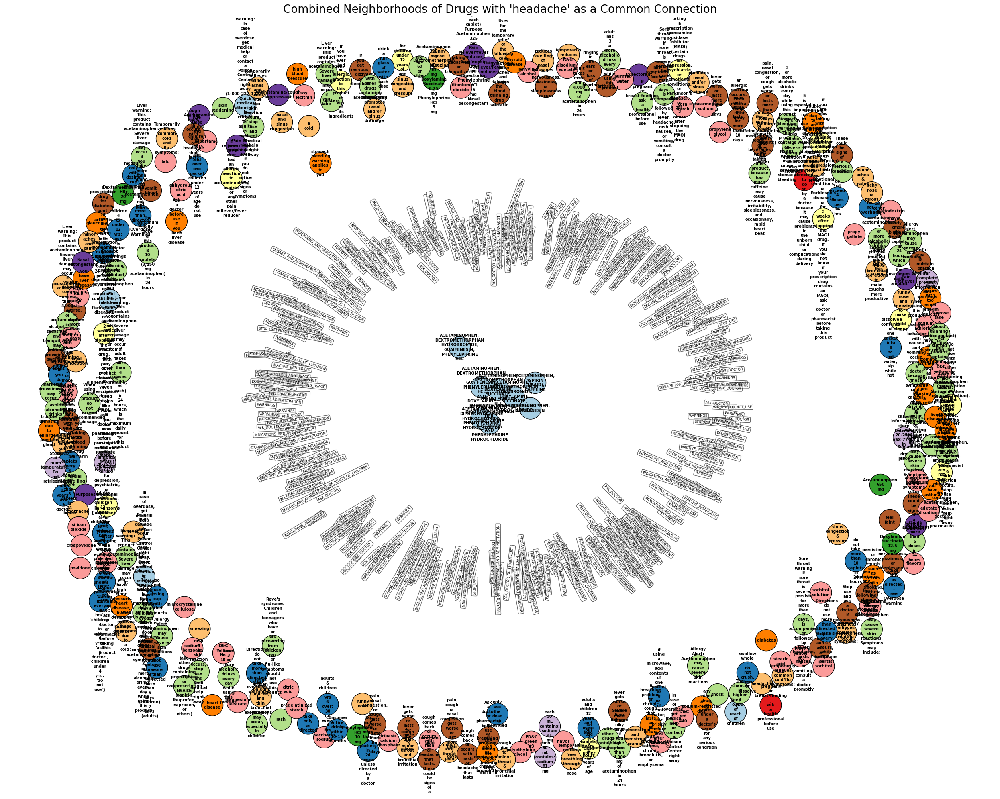

In [ ]:
# --- Visualization of the Combined Neighborhoods ---

# 1. Define the central node
headache_node = "headache"

# 2. Get the drugs connected to the central node
headache_drugs = [
    source for source, target, data in kg.in_edges(headache_node, data=True)
    if data.get('relationship') == 'INDICATIONS_AND_USAGE'
]

# 3. Build a list of all nodes to include in the combined subgraph
subgraph_nodes = {headache_node}
for drug in headache_drugs:
    subgraph_nodes.add(drug)
    subgraph_nodes.update(kg.neighbors(drug)) # Get the neighbors of each drug

# 4. Create the subgraph
combined_subgraph = kg.subgraph(subgraph_nodes)

# 5. Set up the plot
plt.figure(figsize=(25, 20))
pos = nx.spring_layout(combined_subgraph, k=0.1, iterations=50, seed=42)

# 6. Color and style nodes by type
node_types = nx.get_node_attributes(combined_subgraph, 'type')
unique_types = list(set(node_types.values()))
color_map = plt.cm.get_cmap('Paired', len(unique_types))
colors = [color_map(unique_types.index(node_types.get(node, 'unknown'))) for node in combined_subgraph.nodes()]

# 7. Draw the nodes, labels, and edges
nx.draw_networkx_nodes(combined_subgraph, pos, node_color=colors, node_size=1500, edgecolors='black')

labels = {node: '\n'.join(node.split()) for node in combined_subgraph.nodes()}
nx.draw_networkx_labels(combined_subgraph, pos, labels=labels, font_size=7, font_family='sans-serif', font_weight='bold')

edge_labels = nx.get_edge_attributes(combined_subgraph, 'relationship')
nx.draw_networkx_edge_labels(combined_subgraph, pos, edge_labels=edge_labels, font_size=6, bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.6))

plt.title("Combined Neighborhoods of Drugs with 'headache' as a Common Connection", size=20)
plt.axis('off')
plt.tight_layout()
plt.show()


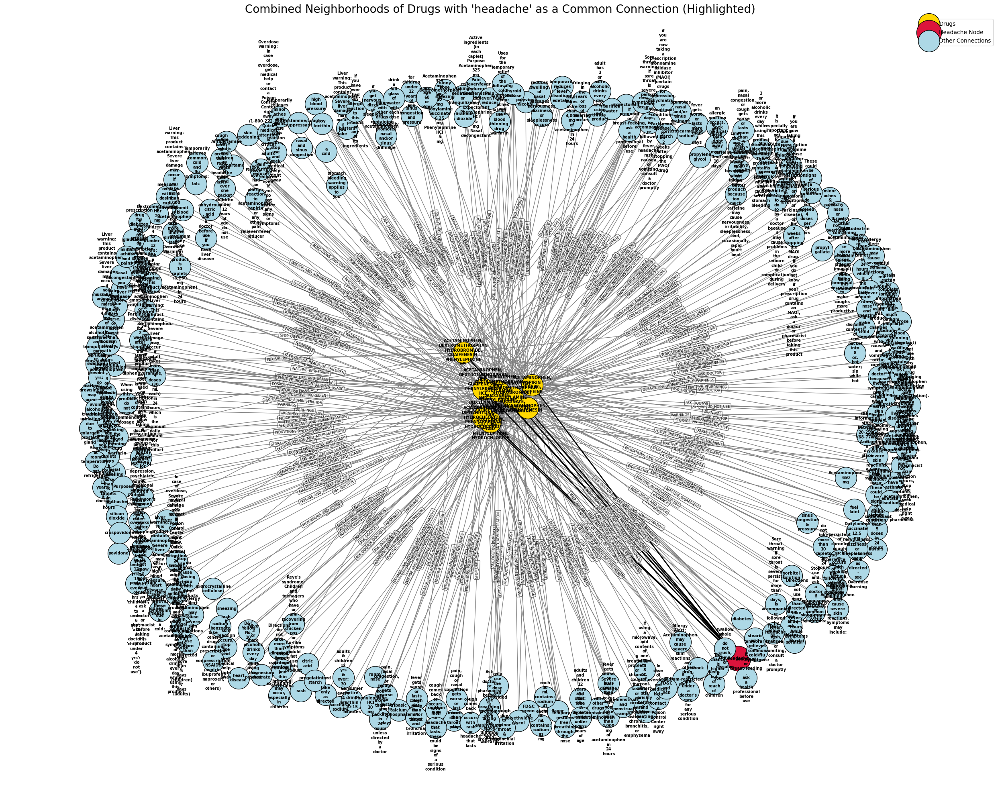

In [ ]:
# --- Visualization of the Combined Neighborhoods ---

# 1. Define the central node
headache_node = "headache"

# 2. Get the drugs connected to the central node
headache_drugs = [
    source for source, target, data in kg.in_edges(headache_node, data=True)
    if data.get('relationship') == 'INDICATIONS_AND_USAGE'
]

# 3. Build a list of all nodes to include in the combined subgraph
subgraph_nodes = {headache_node}
for drug in headache_drugs:
    subgraph_nodes.add(drug)
    subgraph_nodes.update(kg.neighbors(drug))

# 4. Create the subgraph
combined_subgraph = kg.subgraph(subgraph_nodes)

# 5. Separate nodes and edges for highlighting
other_nodes = [n for n in combined_subgraph.nodes() if n not in headache_drugs and n != headache_node]
headache_edges = [(s, t) for s, t, d in combined_subgraph.edges(data=True) if t == headache_node]
other_edges = [e for e in combined_subgraph.edges() if e not in headache_edges]

# 6. Set up the plot
plt.figure(figsize=(25, 20))
pos = nx.spring_layout(combined_subgraph, k=0.1, iterations=50, seed=42)

# 7. Draw nodes with specific colors for highlighting
nx.draw_networkx_nodes(combined_subgraph, pos, nodelist=headache_drugs, node_color='gold', node_size=1500, edgecolors='black', label="Drugs")
nx.draw_networkx_nodes(combined_subgraph, pos, nodelist=[headache_node], node_color='crimson', node_size=2000, edgecolors='black', label="Headache Node")
nx.draw_networkx_nodes(combined_subgraph, pos, nodelist=other_nodes, node_color='lightblue', node_size=1500, edgecolors='black', label="Other Connections")

# 8. Draw edges with specific colors for highlighting
nx.draw_networkx_edges(combined_subgraph, pos, edgelist=other_edges, edge_color='gray', arrowsize=20)
nx.draw_networkx_edges(combined_subgraph, pos, edgelist=headache_edges, edge_color='black', width=2, arrowsize=25)

# 9. Draw labels
node_labels = {node: '\n'.join(node.split()) for node in combined_subgraph.nodes()}
nx.draw_networkx_labels(combined_subgraph, pos, labels=node_labels, font_size=7, font_family='sans-serif', font_weight='bold')

edge_labels = nx.get_edge_attributes(combined_subgraph, 'relationship')
nx.draw_networkx_edge_labels(combined_subgraph, pos, edge_labels=edge_labels, font_size=6, bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.6))

plt.title("Combined Neighborhoods of Drugs with 'headache' as a Common Connection (Highlighted)", size=20)
plt.axis('off')
plt.tight_layout()
plt.legend(scatterpoints=1)
plt.show()

### drive folder with all json files and issues addressed

In [ ]:
# Rebuild KG from scratch with drug label relations + brand→generic edges
import os
import json
import re
import ast
import networkx as nx

# ===========================
# CONFIG
# ===========================
folder_location = "/content/drive/MyDrive/drug_data/drug_data"  # JSON folder
druglist_file = "/content/drive/MyDrive/fda_drugs_with_brand_generic_names_for_tool.py"
graphml_output = "/content/drive/MyDrive/drug_data_kg_rebuilt.graphml"
deduplicate = True

# ===========================
# HELPERS
# ===========================
def process_html_content(text):
    """Remove HTML tags and trim whitespace."""
    if isinstance(text, str):
        return re.sub(r'<[^<]+?>', '', text).strip()
    return text

def safe_to_list(x):
    """Normalize values into a list."""
    if isinstance(x, bool):
        return [str(x)]
    if x is None:
        return []
    if isinstance(x, list):
        return x
    return [x]

def merge_secondary_keys(drug_data, all_relations):
    """Merge keys like 'purpose2' into 'purpose'."""
    merged = dict(drug_data)
    for key, value in list(drug_data.items()):
        if key.endswith("2"):
            primary = key[:-1]
            if primary in all_relations:
                if isinstance(value, list):
                    merged.setdefault(primary, [])
                    if isinstance(merged[primary], list):
                        merged[primary].extend(value)
                elif isinstance(value, dict):
                    merged.setdefault(primary, {})
                    if isinstance(merged[primary], dict):
                        for sub_k, sub_v in value.items():
                            merged[primary].setdefault(sub_k, [])
                            merged[primary][sub_k].extend(safe_to_list(sub_v))
    return merged

def load_drug_list_from_py(py_path):
    """Extract `drug_list` variable from a Python file."""
    if not os.path.exists(py_path):
        print(f"Drug list file not found: {py_path}")
        return []
    text = open(py_path, "r", encoding="utf-8").read()
    parsed = ast.parse(text)
    for node in parsed.body:
        if isinstance(node, ast.Assign):
            for target in node.targets:
                if isinstance(target, ast.Name) and target.id == "drug_list":
                    return ast.literal_eval(node.value)
    return []

# ===========================
# BUILD GRAPH
# ===========================
def build_kg_from_json(folder_path, drug_list, deduplicate=True):
    G = nx.DiGraph()
    all_relations = [
        "active_ingredient","purpose","indications_and_usage","do_not_use",
        "ask_doctor","ask_doctor_or_pharmacist","warnings","stop_use",
        "dosage_and_administration","keep_out_of_reach_of_children",
        "pregnancy_or_breast_feeding","storage_and_handling",
        "inactive_ingredient","drug_interactions","overdose_warning"
    ]

    files = [f for f in os.listdir(folder_path) if f.endswith(".json")]
    for filename in files:
        path = os.path.join(folder_path, filename)
        try:
            with open(path, "r", encoding="utf-8") as fh:
                data = json.load(fh)
        except Exception as e:
            print(f"Skipping {filename}: {e}")
            continue

        for drug_name, drug_info in data.items():
            drug_data = drug_info.get(drug_name) if isinstance(drug_info, dict) and drug_name in drug_info else drug_info
            if not isinstance(drug_data, dict):
                continue

            drug_data = merge_secondary_keys(drug_data, all_relations)
            drug_node_id = process_html_content(str(drug_name))
            if not drug_node_id:
                continue

            G.add_node(drug_node_id, type="drug")

            for relation_key, items in drug_data.items():
                if items is None:
                    continue
                if isinstance(items, dict):
                    for sub_key, sub_items in items.items():
                        for it in safe_to_list(sub_items):
                            node_id = process_html_content(str(it))
                            if not node_id:
                                continue
                            node_id = node_id if deduplicate else f"{relation_key}::{node_id}::{len(G.nodes())}"
                            G.add_node(node_id, type=relation_key)
                            relation_name = f"{relation_key}|{sub_key}"
                            G.add_edge(drug_node_id, node_id, relationship=relation_name)
                else:
                    for it in safe_to_list(items):
                        node_id = process_html_content(str(it))
                        if not node_id:
                            continue
                        node_id = node_id if deduplicate else f"{relation_key}::{node_id}::{len(G.nodes())}"
                        G.add_node(node_id, type=relation_key)
                        G.add_edge(drug_node_id, node_id, relationship=relation_key)

    # Add brand → generic edges
    for entry in drug_list:
        brand = process_html_content(str(entry.get("brand_name", ""))).strip()
        generic = process_html_content(str(entry.get("generic_name", ""))).strip()
        if not brand or not generic:
            continue
        if generic in G.nodes:
            G.add_node(brand, type="brand")
            G.add_edge(brand, generic, relationship="IS_BRAND_OF")

    return G

# ===========================
# EXECUTION
# ===========================
drug_list = load_drug_list_from_py(druglist_file)
kg = build_kg_from_json(folder_location, drug_list, deduplicate=deduplicate)

nx.write_graphml(kg, graphml_output)
print(f"Rebuilt KG → Nodes: {kg.number_of_nodes()}, Edges: {kg.number_of_edges()}")
print(f"Saved to: {graphml_output}")


Rebuilt KG → Nodes: 100495, Edges: 160229
Saved to: /content/drive/MyDrive/drug_data_kg_rebuilt.graphml


Graph loaded: 64082 nodes, 117868 edges
Top info nodes: ['Keep out of reach of children', 'For external use only', 'If pregnant or breast-feeding, ask a health professional before use']


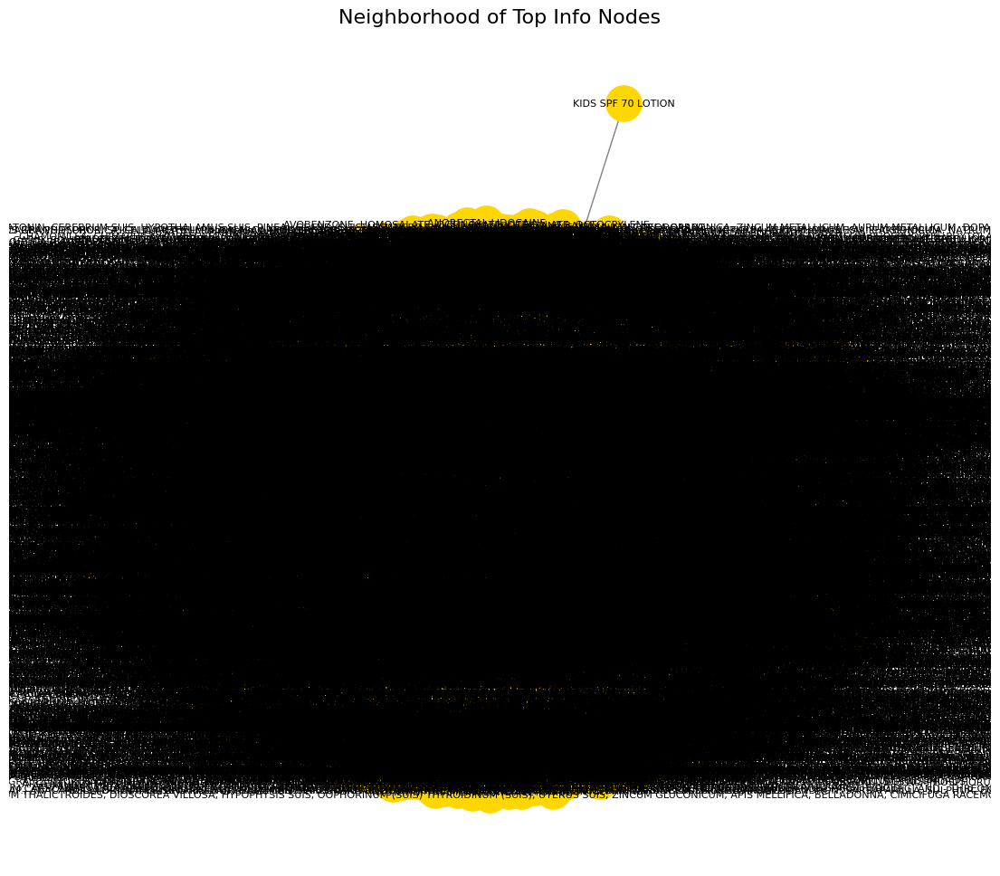

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter

# ==============================
# Load Graph
# ==============================
graphml_path = "/content/drive/MyDrive/drug_data_kg_rebuilt.graphml"
G = nx.read_graphml(graphml_path)
print(f"Graph loaded: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

# ==============================
# Find most common info nodes
# ==============================
info_nodes = [n for n, d in G.nodes(data=True) if d.get("type") != "drug"]
degree_count = Counter({n: G.degree(n) for n in info_nodes})
top_nodes = [n for n, _ in degree_count.most_common(3)]
print("Top info nodes:", top_nodes)

# ==============================
# Build neighborhood subgraph
# ==============================
sub_nodes = set(top_nodes)

for node in top_nodes:
    neighbors = list(G.predecessors(node)) + list(G.successors(node))
    sub_nodes.update(neighbors)

subgraph = G.subgraph(sub_nodes)

# ==============================
# Visualization
# ==============================
plt.figure(figsize=(14, 12))
pos = nx.spring_layout(subgraph, k=0.5, seed=42)

# Drug nodes (yellow)
nx.draw_networkx_nodes(subgraph, pos,
    nodelist=[n for n, d in subgraph.nodes(data=True) if d.get("type") == "drug"],
    node_color="gold", node_size=800)

# Info nodes (blue)
nx.draw_networkx_nodes(subgraph, pos,
    nodelist=[n for n in subgraph if subgraph.nodes[n].get("type") != "drug" and n not in top_nodes],
    node_color="skyblue", node_size=600)

# Top info nodes (red, big)
nx.draw_networkx_nodes(subgraph, pos,
    nodelist=top_nodes, node_color="crimson", node_size=1200)

# Edges
nx.draw_networkx_edges(subgraph, pos, edge_color="gray")

# Labels (only for top info + neighbors)
labels = {n: n for n in subgraph}
nx.draw_networkx_labels(subgraph, pos, labels, font_size=8)

plt.title("Neighborhood of Top Info Nodes", fontsize=16)
plt.axis("off")
plt.show()


Graph loaded: 100495 nodes, 160229 edges
Top info nodes: ['Keep out of reach of children', 'For external use only', 'ALCOHOL']


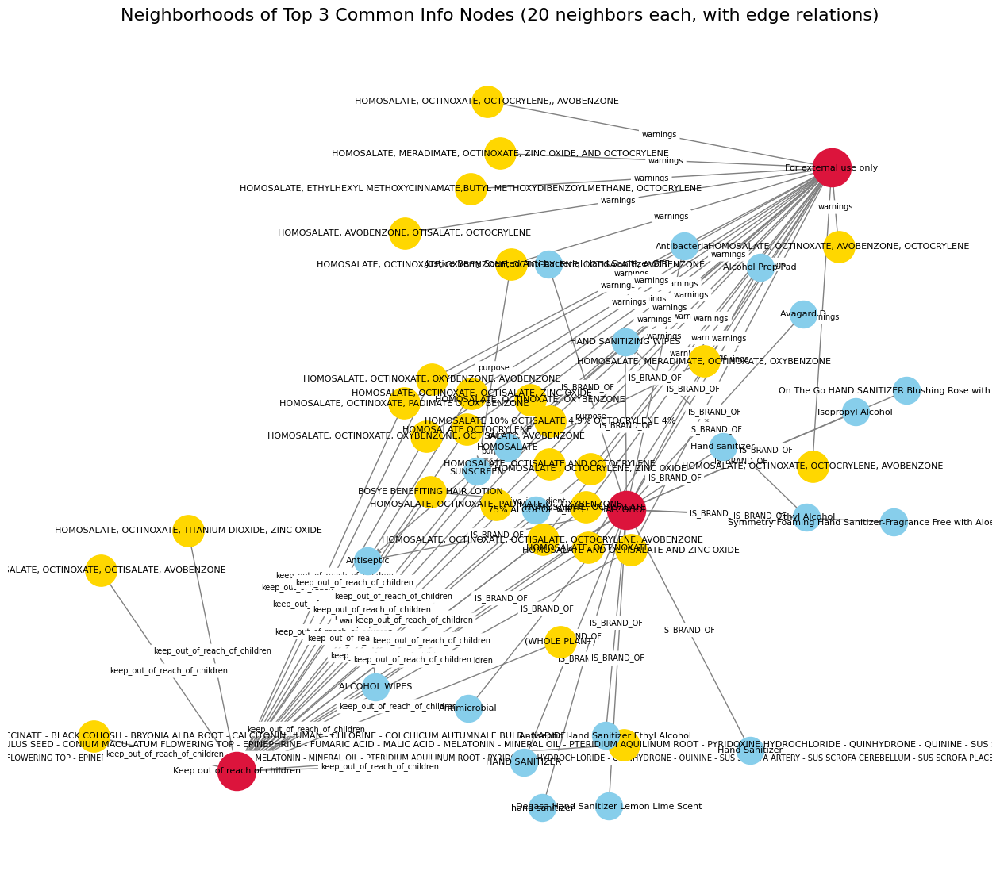

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter

# ==============================
# Load Graph
# ==============================
graphml_path = "/content/drive/MyDrive/drug_data_kg_rebuilt.graphml"
G = nx.read_graphml(graphml_path)
print(f"Graph loaded: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

# ==============================
# Find most common info nodes
# ==============================
info_nodes = [n for n, d in G.nodes(data=True) if d.get("type") != "drug"]
degree_count = Counter({n: G.degree(n) for n in info_nodes})
top_nodes = [n for n, _ in degree_count.most_common(3)]
print("Top info nodes:", top_nodes)

# ==============================
# Build neighborhood subgraph (limit 20 per top node)
# ==============================
sub_nodes = set(top_nodes)

for node in top_nodes:
    neighbors = list(G.predecessors(node)) + list(G.successors(node))
    neighbors = neighbors[:20]  # limit to 20
    sub_nodes.update(neighbors)

subgraph = G.subgraph(sub_nodes)

# ==============================
# Visualization
# ==============================
plt.figure(figsize=(16, 14))
pos = nx.spring_layout(subgraph, k=0.6, seed=42)

# Drug nodes (yellow)
nx.draw_networkx_nodes(
    subgraph, pos,
    nodelist=[n for n, d in subgraph.nodes(data=True) if d.get("type") == "drug"],
    node_color="gold", node_size=800
)

# Info nodes (blue)
nx.draw_networkx_nodes(
    subgraph, pos,
    nodelist=[n for n in subgraph if subgraph.nodes[n].get("type") != "drug" and n not in top_nodes],
    node_color="skyblue", node_size=600
)

# Top info nodes (red, big)
nx.draw_networkx_nodes(
    subgraph, pos,
    nodelist=top_nodes, node_color="crimson", node_size=1200
)

# Edges
nx.draw_networkx_edges(subgraph, pos, edge_color="gray")

# Labels (nodes)
labels = {n: n for n in subgraph}
nx.draw_networkx_labels(subgraph, pos, labels, font_size=8)

# Labels (edges → relationships)
edge_labels = nx.get_edge_attributes(subgraph, "relationship")
nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_size=7, rotate=False)

plt.title("Neighborhoods of Top 3 Common Info Nodes (20 neighbors each, with edge relations)", fontsize=16)
plt.axis("off")
plt.show()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import networkx as nx
from collections import Counter

# ==============================
# Load Graph
# ==============================
graphml_path = "/content/drive/MyDrive/drug_data_kg_rebuilt.graphml"
G = nx.read_graphml(graphml_path)
print(f"Graph loaded: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

# ==============================
# Define all possible relations
# ==============================
all_relations = [
    "active_ingredient","purpose","indications_and_usage","do_not_use",
    "ask_doctor","ask_doctor_or_pharmacist","warnings","stop_use",
    "dosage_and_administration","keep_out_of_reach_of_children",
    "pregnancy_or_breast_feeding","storage_and_handling",
    "inactive_ingredient","drug_interactions","overdose_warning"
]

# ==============================
# Count edges per relationship class
# ==============================
edge_rels = [d.get("relationship", "unknown") for _, _, d in G.edges(data=True)]
edge_class_count = Counter(edge_rels)

print("\nEdge class counts (only the defined classes):")
for rel in all_relations:
    print(f"{rel}: {edge_class_count.get(rel, 0)}")

# Optionally, count unknown or extra classes
extra_classes = {k: v for k, v in edge_class_count.items() if k not in all_relations}
if extra_classes:
    print("\nEdges with unknown or unexpected relationship labels:")
    for k, v in extra_classes.items():
        print(f"{k}: {v}")


Graph loaded: 100495 nodes, 160229 edges

Edge class counts (only the defined classes):
active_ingredient: 16512
purpose: 9952
indications_and_usage: 14655
do_not_use: 2658
ask_doctor: 3551
ask_doctor_or_pharmacist: 942
warnings: 19986
stop_use: 5762
dosage_and_administration: 20579
keep_out_of_reach_of_children: 7563
pregnancy_or_breast_feeding: 1939
storage_and_handling: 2697
inactive_ingredient: 8911
drug_interactions: 4

Edges with unknown or unexpected relationship labels:
error: 466
.ALPHA.-KETOGLUTARIC ACID - AMBERGRIS - ANAMIRTA COCCULUS SEED - CONIUM MACULATUM FLOWERING TOP - EPINEPHRINE - FUMARIC ACID - MALIC ACID - MELATONIN - MINERAL OIL - PTERIDIUM AQUILINUM ROOT - PYRIDOXINE HYDROCHLORIDE - QUINHYDRONE - QUININE - SUS SCROFA ARTERY - SUS SCROFA CEREBELLUM - SUS SCROFA PLACENTA - THIAMINE HYDROCHLORIDE - TOBACCO LEAF|active_ingredient: 3
.ALPHA.-KETOGLUTARIC ACID - AMBERGRIS - ANAMIRTA COCCULUS SEED - CONIUM MACULATUM FLOWERING TOP - EPINEPHRINE - FUMARIC ACID - MALIC ACID

In [ ]:
import networkx as nx

# ==============================
# Load Graph
# ==============================
graphml_path = "/content/drive/MyDrive/drug_data_kg_rebuilt.graphml"
G = nx.read_graphml(graphml_path)
print(f"Graph loaded: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

# ==============================
# Check if all edges have 'relationship' label
# ==============================
missing_labels = [(u, v) for u, v, d in G.edges(data=True) if "relationship" not in d]

if not missing_labels:
    print("✅ All edges have a 'relationship' label.")
else:
    print(f"⚠️ {len(missing_labels)} edges are missing the 'relationship' attribute.")
    # Optionally, print first few missing edges
    print("Examples of edges missing labels:", missing_labels[:10])


Graph loaded: 100495 nodes, 160229 edges
✅ All edges have a 'relationship' label.


Graph loaded: 100495 nodes, 160229 edges
Top info nodes: ['Keep out of reach of children', 'For external use only', 'ALCOHOL']


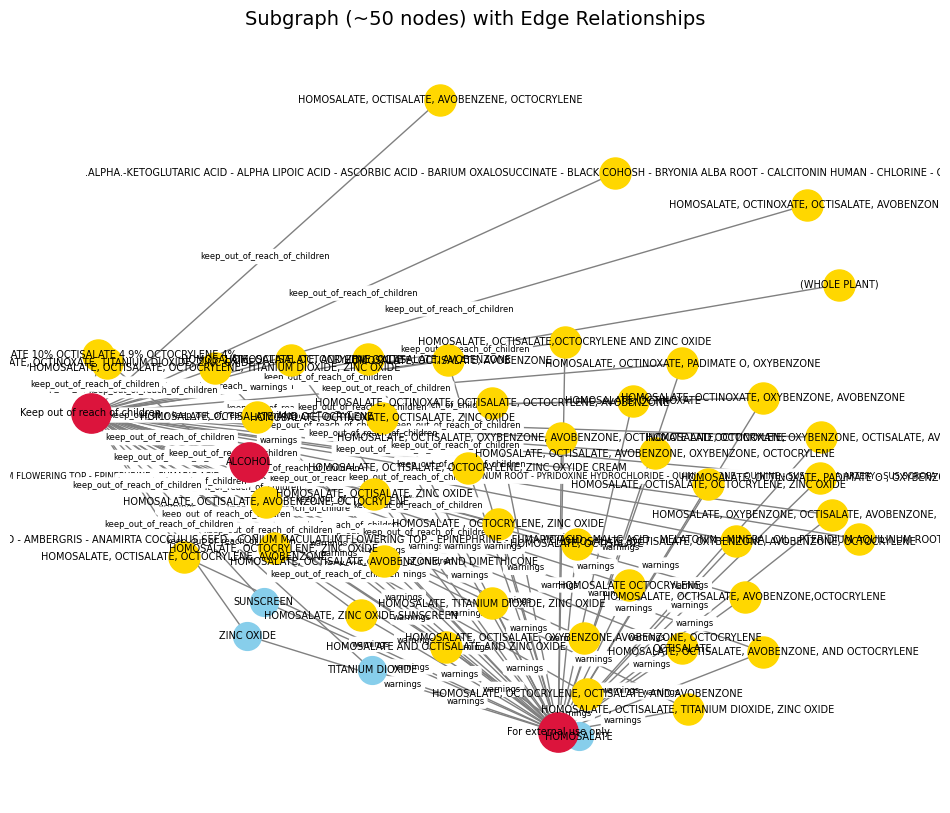

✅ All edges in the subgraph have 'relationship' labels.


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter

# ==============================
# Load Graph
# ==============================
graphml_path = "/content/drive/MyDrive/drug_data_kg_rebuilt.graphml"
G = nx.read_graphml(graphml_path)
print(f"Graph loaded: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

# ==============================
# Top info nodes by degree
# ==============================
info_nodes = [n for n, d in G.nodes(data=True) if d.get("type") != "drug"]
degree_count = Counter({n: G.degree(n) for n in info_nodes})
top_nodes = [n for n, _ in degree_count.most_common(3)]
print("Top info nodes:", top_nodes)

# ==============================
# Build subgraph (limit 50 nodes)
# ==============================
sub_nodes = set(top_nodes)
for node in top_nodes:
    neighbors = list(G.predecessors(node)) + list(G.successors(node))
    for n in neighbors:
        if len(sub_nodes) >= 50:
            break
        sub_nodes.add(n)
subgraph = G.subgraph(sub_nodes)

# ==============================
# Visualization
# ==============================
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(subgraph, k=0.6, seed=42)

# Node colors
nx.draw_networkx_nodes(subgraph, pos,
                       nodelist=[n for n, d in subgraph.nodes(data=True) if d.get("type") == "drug"],
                       node_color="gold", node_size=500)
nx.draw_networkx_nodes(subgraph, pos,
                       nodelist=[n for n in subgraph if subgraph.nodes[n].get("type") != "drug" and n not in top_nodes],
                       node_color="skyblue", node_size=400)
nx.draw_networkx_nodes(subgraph, pos,
                       nodelist=top_nodes, node_color="crimson", node_size=800)

# Edges
nx.draw_networkx_edges(subgraph, pos, edge_color="gray")

# Labels
nx.draw_networkx_labels(subgraph, pos, font_size=7)

# Edge labels
edge_labels = { (u,v): d.get("relationship", "unknown") for u, v, d in subgraph.edges(data=True) }
nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_size=6, rotate=False)

plt.title("Subgraph (~50 nodes) with Edge Relationships", fontsize=14)
plt.axis("off")
plt.show()

# ==============================
# Check for missing edge labels
# ==============================
missing_edges = [(u, v) for u, v, d in subgraph.edges(data=True) if "relationship" not in d]
if not missing_edges:
    print("✅ All edges in the subgraph have 'relationship' labels.")
else:
    print(f"⚠️ {len(missing_edges)} edges are missing 'relationship' labels in the subgraph.")
